In [148]:
import pandas as pd
data = pd.read_csv('C:/Users/vichua/Downloads/Clock backtest 20241019 - Gather.csv')
data["Date"] = pd.to_datetime(data["Date"])
data.rename(columns = {'Cycle (國聯證券)': 'Cycle - CN Report'}, inplace=True)
data.iloc[:,5:] = data.iloc[:,5:]/100

C:\Users\vichua\AppData\Local\Temp\ipykernel_31196\957147694.py:3: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  data["Date"] = pd.to_datetime(data["Date"])


In [149]:
data.head()

,Date,Year,Month,Cycle,Cycle - CN Report,CN01Y,CN02Y,CN03Y,CN05Y,CN07Y,...,SZMII,SZMSI,SZPI,SZSRIP,SZTSI,SZTSSI,SZUII,SZUSI,CSI300,HSI
0,2002-08-30,2002,8,Recovery,NaN,0.024,-0.015,-0.029,-0.039,-0.004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.022
1,2002-09-30,2002,9,Recovery,NaN,-0.206,-0.174,-0.143,-0.081,-0.084,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.097
2,2002-10-31,2002,10,Recovery,NaN,0.081,0.004,-0.041,-0.060,-0.036,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.041
3,2002-11-29,2002,11,Overheat,NaN,-0.111,-0.030,0.064,0.004,-0.091,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.067
4,2002-12-31,2002,12,Overheat,NaN,0.009,0.001,-0.058,0.017,0.097,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.074


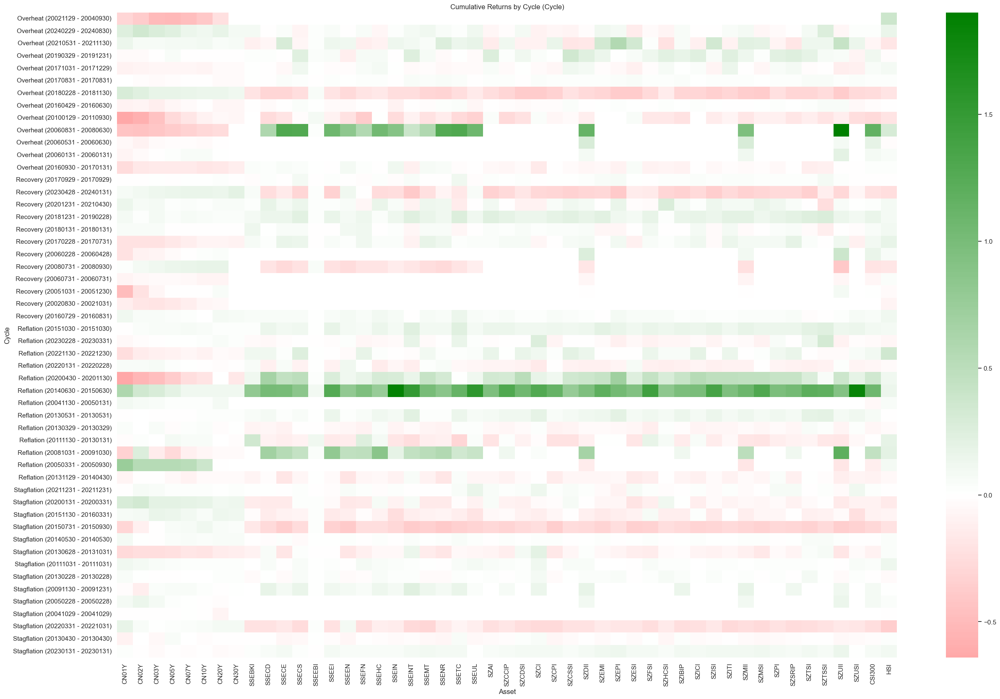

In [191]:
df = pd.DataFrame(data)
df["Date"] = pd.to_datetime(df["Date"])

# Columns from the 5th onward
columns_to_cumprod = df.columns[5:]

source = 'Cycle'

# Compute start and end dates for each cycle
# Identify cycle changes by comparing with the previous row
df["cycle_change"] = df[source] != df[source].shift()
# Use `cumsum` to create a unique group for each continuous cycle segment
df["cycle_group"] = df["cycle_change"].cumsum()
cycle_dates = df.groupby([source, "cycle_group"]).agg(start_date=("Date", "min"), end_date=("Date", "max")).reset_index()

# Compute cumulative product for each column in each cycle and get the last value in each group
cumprod_results = df.groupby([source, "cycle_group"])[columns_to_cumprod].apply(lambda x: (1 + x).cumprod().iloc[-1] - 1).reset_index()

# Merge start and end dates with cumulative product results
cycle_summary = pd.merge(cycle_dates, cumprod_results, on=[source, "cycle_group"])

cycle_summary = cycle_summary.sort_values(source)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

heatmap_data = cycle_summary.copy()
heatmap_data["idx"] = cycle_summary[source] + " (" + cycle_summary["start_date"].dt.strftime("%Y%m%d") + " - " + cycle_summary["end_date"].dt.strftime("%Y%m%d") + ")"
heatmap_data = heatmap_data.set_index("idx").drop(columns=["start_date", "end_date", source, "cycle_group"])
# Plot the heatmap
colors = ["red", "white", "green"]
cmap = LinearSegmentedColormap.from_list("custom_red_yellow_green", colors)
plt.figure(figsize=(30, 20))
sns.heatmap(heatmap_data, annot=False, cmap=cmap, fmt=".2%", center=0)
plt.title(f"Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

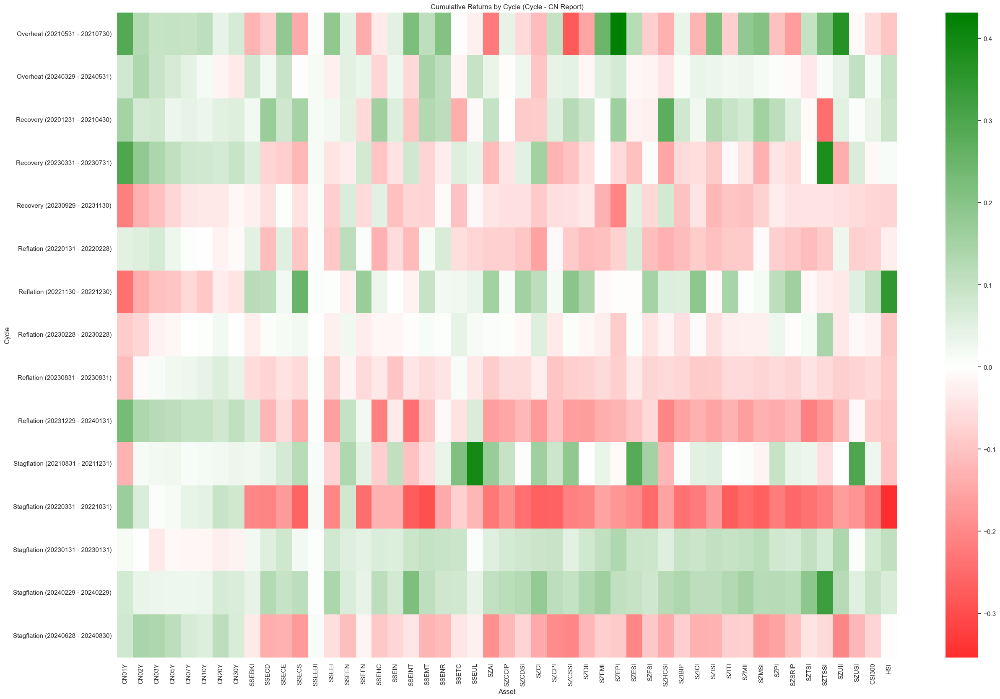

In [192]:
df = pd.DataFrame(data)
df["Date"] = pd.to_datetime(df["Date"])

# Columns from the 5th onward
columns_to_cumprod = df.columns[5:]

source = 'Cycle - CN Report'

# Compute start and end dates for each cycle
# Identify cycle changes by comparing with the previous row
df["cycle_change"] = df[source] != df[source].shift()
# Use `cumsum` to create a unique group for each continuous cycle segment
df["cycle_group"] = df["cycle_change"].cumsum()
cycle_dates = df.groupby([source, "cycle_group"]).agg(start_date=("Date", "min"), end_date=("Date", "max")).reset_index()

# Compute cumulative product for each column in each cycle and get the last value in each group
cumprod_results = df.groupby([source, "cycle_group"])[columns_to_cumprod].apply(lambda x: (1 + x).cumprod().iloc[-1] - 1).reset_index()

# Merge start and end dates with cumulative product results
cycle_summary = pd.merge(cycle_dates, cumprod_results, on=[source, "cycle_group"])

cycle_summary = cycle_summary.sort_values(source)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

heatmap_data = cycle_summary.copy()
heatmap_data["idx"] = cycle_summary[source] + " (" + cycle_summary["start_date"].dt.strftime("%Y%m%d") + " - " + cycle_summary["end_date"].dt.strftime("%Y%m%d") + ")"
heatmap_data = heatmap_data.set_index("idx").drop(columns=["start_date", "end_date", source, "cycle_group"])
# Plot the heatmap
colors = ["red", "white", "green"]
cmap = LinearSegmentedColormap.from_list("custom_red_yellow_green", colors)
plt.figure(figsize=(30, 20))
sns.heatmap(heatmap_data, annot=False, cmap=cmap, fmt=".2%", center=0)
plt.title(f"Cumulative Returns by Cycle ({source})")
plt.xlabel("Asset")
plt.ylabel("Cycle")
plt.show()

In [189]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

source = 'Cycle - CN Report'
f = 'CSI300'
df = data[['Date',source, f]].dropna()
df['return'] = (1 + df[f]/100).cumprod()

# Identify cycle changes by comparing with the previous row
df["cycle_change"] = df[source] != df[source].shift()

# Use `cumsum` to create a unique group for each continuous cycle segment
df["cycle_group"] = df["cycle_change"].cumsum()

# Group by cycle and cycle_group, then find the min and max dates for each group
cycle_periods = df.groupby([source, "cycle_group"]).agg(
    start_date=("Date", "min"),
    end_date=("Date", "max"),
    cycle=(source, "first")
).reset_index(drop=True)

print(cycle_periods.groupby('cycle')['start_date'].count())
cycle_periods.sort_values('start_date').head(20)

cycle
Overheat       2
Recovery       3
Reflation      5
Stagflation    5
Name: start_date, dtype: int64


,start_date,end_date,cycle
2,2020-12-31,2021-04-30,Recovery
0,2021-05-31,2021-07-30,Overheat
10,2021-08-31,2021-12-31,Stagflation
5,2022-01-31,2022-02-28,Reflation
11,2022-03-31,2022-10-31,Stagflation
6,2022-11-30,2022-12-30,Reflation
12,2023-01-31,2023-01-31,Stagflation
7,2023-02-28,2023-02-28,Reflation
3,2023-03-31,2023-07-31,Recovery
8,2023-08-31,2023-08-31,Reflation


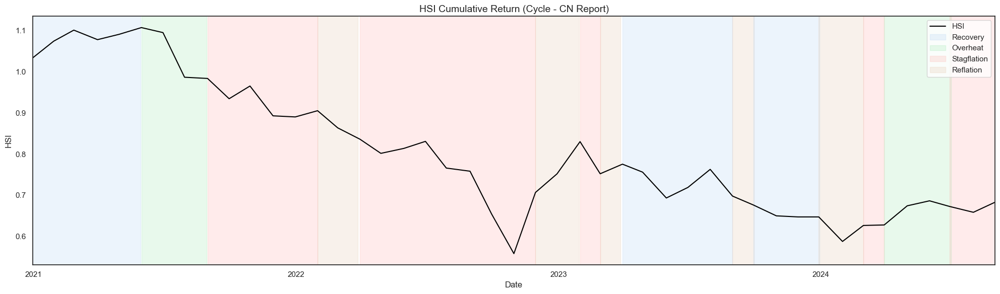

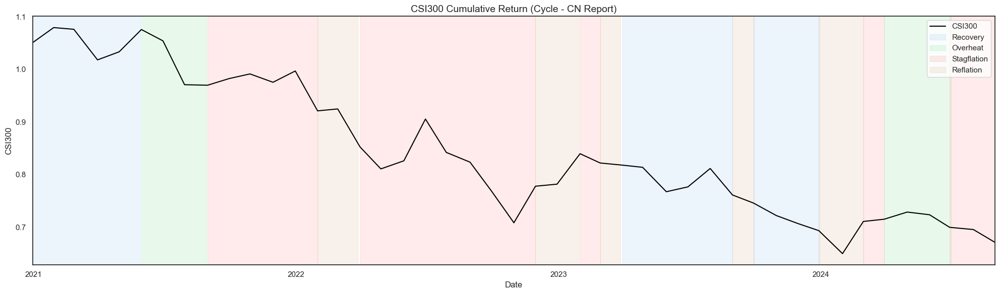

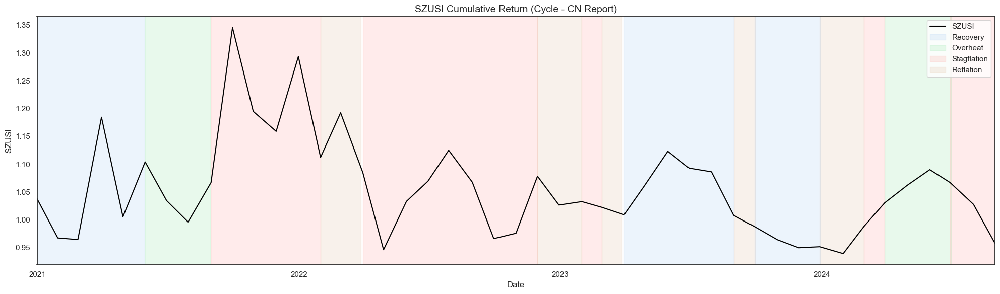

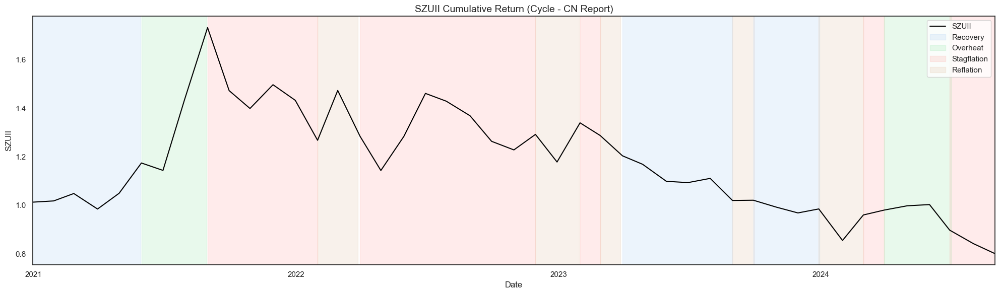

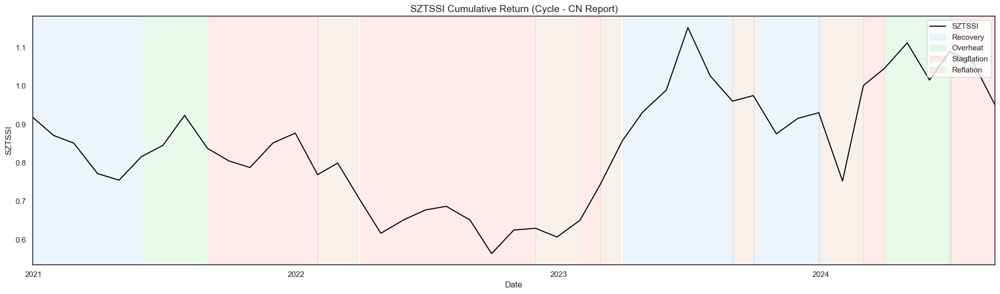

...

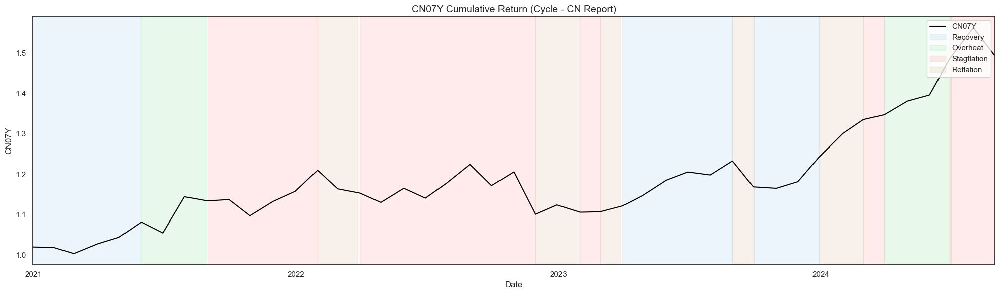

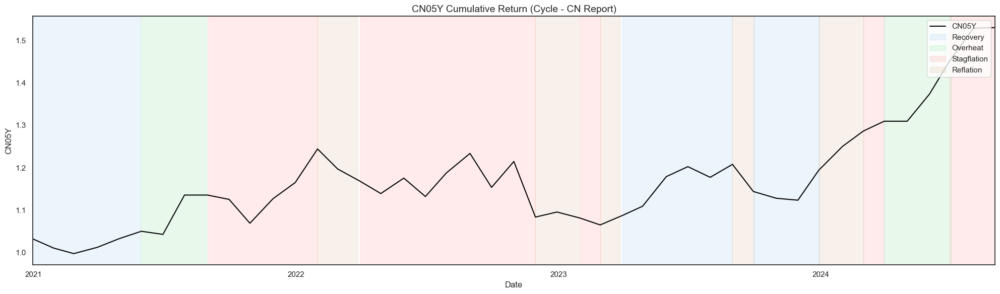

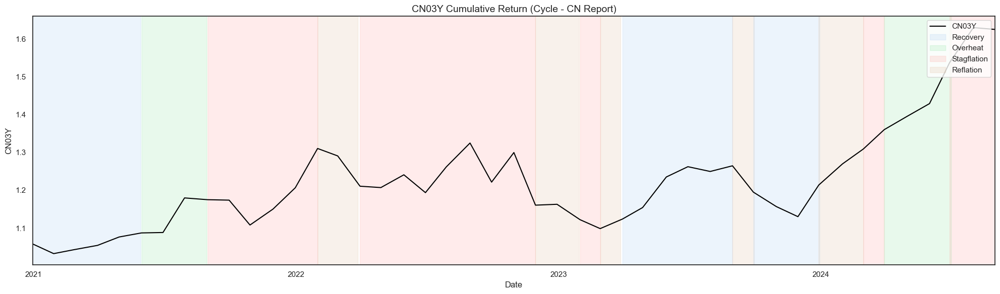

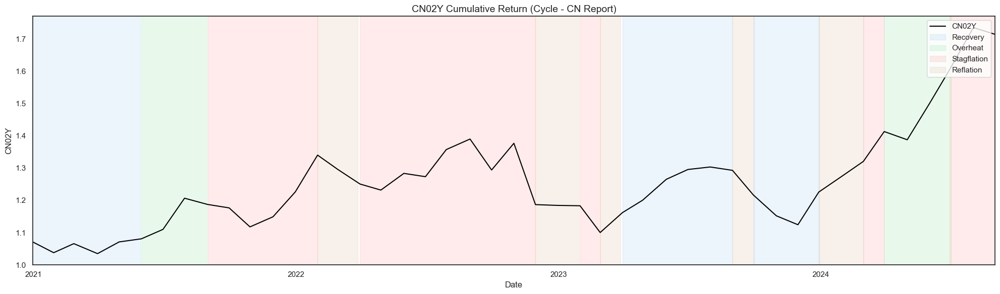

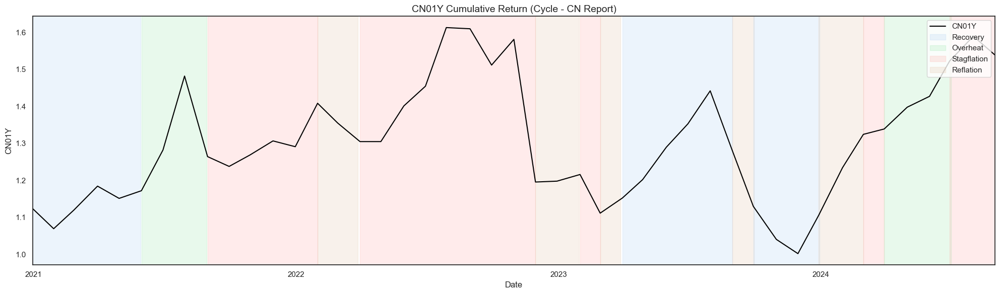

In [134]:
import matplotlib.dates as mdates

# Set up the seaborn theme
sns.set(style="white")
source = 'Cycle - CN Report'

for f in list(data.columns[5:])[::-1]:
    df = data[['Date',source, f]].dropna()
    df['return'] = (1 + df[f]/100).cumprod()
    # Identify cycle changes by comparing with the previous row
    df["cycle_change"] = df[source] != df[source].shift()

    # Use `cumsum` to create a unique group for each continuous cycle segment
    df["cycle_group"] = df["cycle_change"].cumsum()

    # Group by cycle and cycle_group, then find the min and max dates for each group
    cycle_periods = df.groupby([source, "cycle_group"]).agg(
        start_date=("Date", "min"),
        end_date=("Date", "max"),
        cycle=(source, "first")
    ).reset_index(drop=True)
    
    cycle_periods.sort_values('start_date').head(20)

    # Create the plot
    fig, ax = plt.subplots(figsize=(20, 6))

    # Use seaborn's lineplot for the return line
    sns.lineplot(data=df, x="Date", y="return", color="black", ax=ax, label=f)

    # Define colors for each cycle type
    pastel_colors = sns.color_palette("pastel")
    cycle_colors = {
        "Reflation": pastel_colors[5], 
        "Recovery": pastel_colors[0],  
        "Overheat": pastel_colors[2],     
        "Stagflation": pastel_colors[3]   
    }
    # Add shaded background colors for each cycle period
    for cycle_group, group_data in df.groupby("cycle_group"):
        cycle_name = group_data[source].iloc[0]
        color = cycle_colors.get(cycle_name, "gray")
        ax.axvspan(group_data["Date"].min(), group_data["Date"].max() + pd.DateOffset(months=1), color=color, alpha=0.2, label=cycle_name)

    # Ensure the x-axis limits match the data range to avoid cutoff
    ax.set_xlim(df["Date"].min(), df["Date"].max())

    # Remove duplicate legend entries
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc="upper right")

    # Enhance plot aesthetics
    ax.set_xlabel("Date", fontsize=12)
    ax.set_ylabel(f, fontsize=12)
    ax.set_title(f"{f} Cumulative Return ({source})", fontsize=14)
    # plt.xticks(rotation=45)
    # sns.despine(trim=True)  # Optional: removes top and right spines for a cleaner look

    # Format the x-axis to show "MMM-YY"
    ax.xaxis.set_major_locator(mdates.YearLocator())
    # ax.xaxis.set_major_formatter(DateFormatter("%Y"))

    plt.tight_layout()
    plt.show()

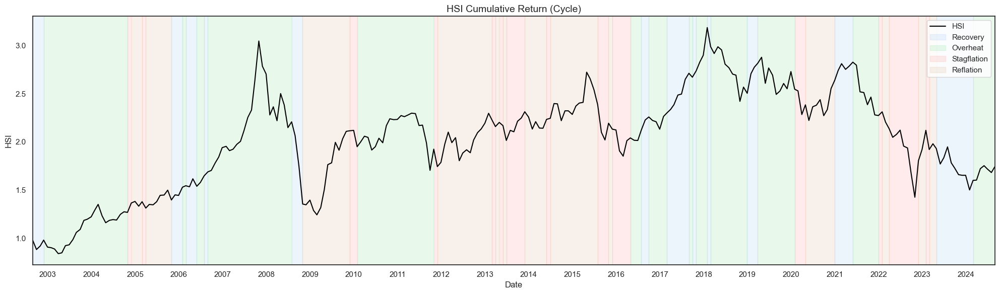

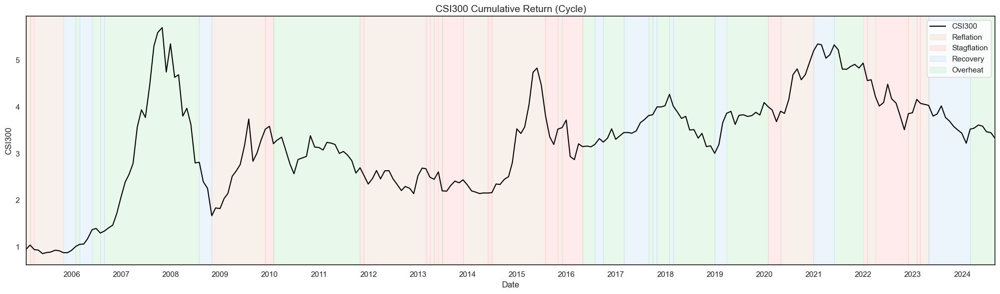

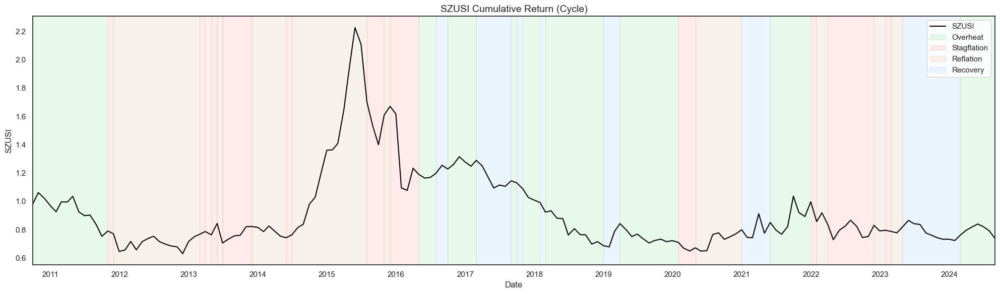

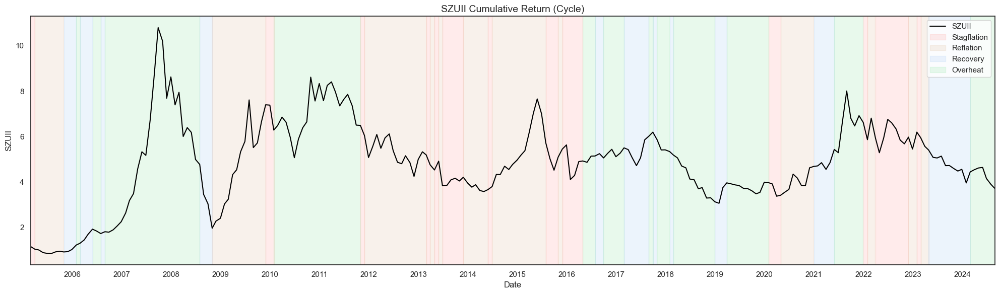

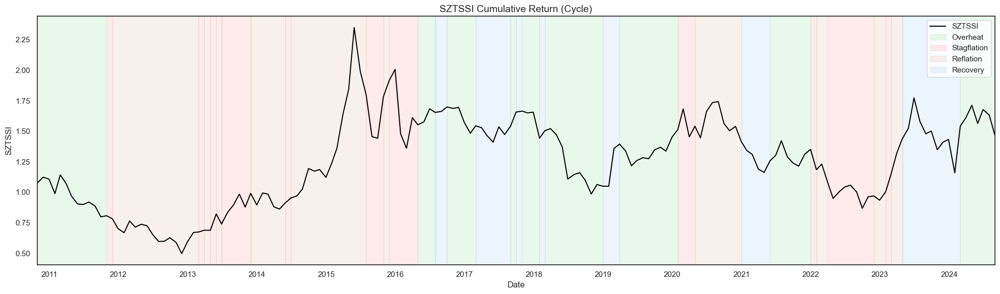

...

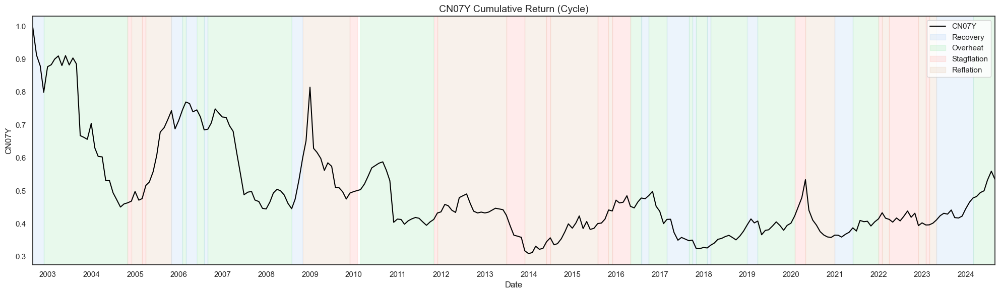

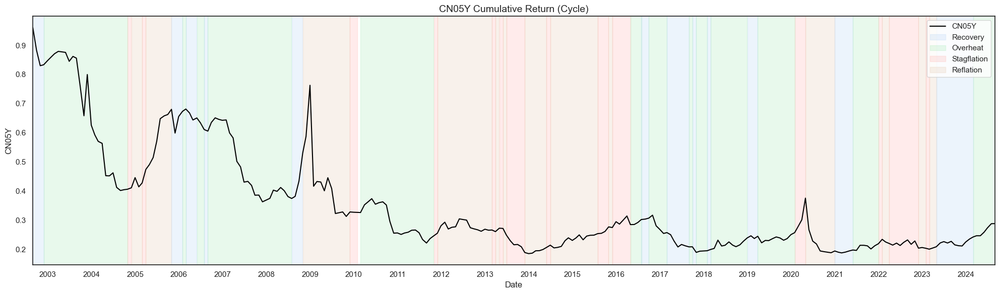

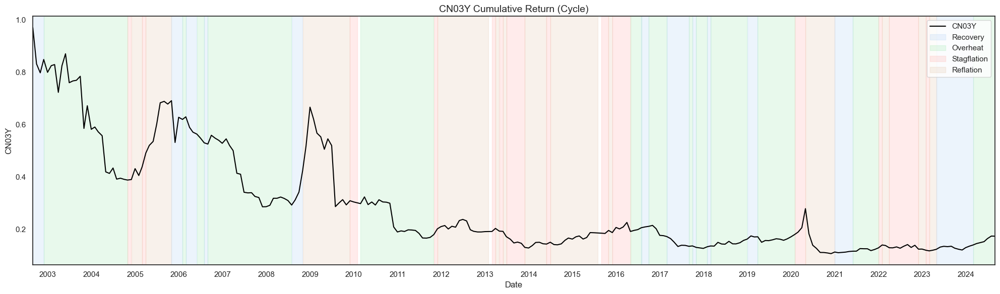

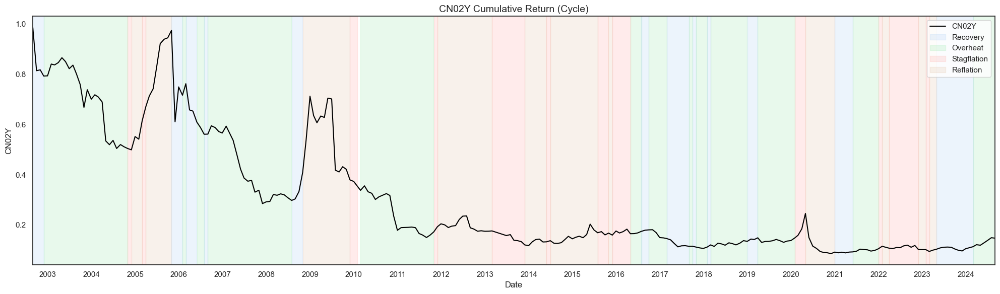

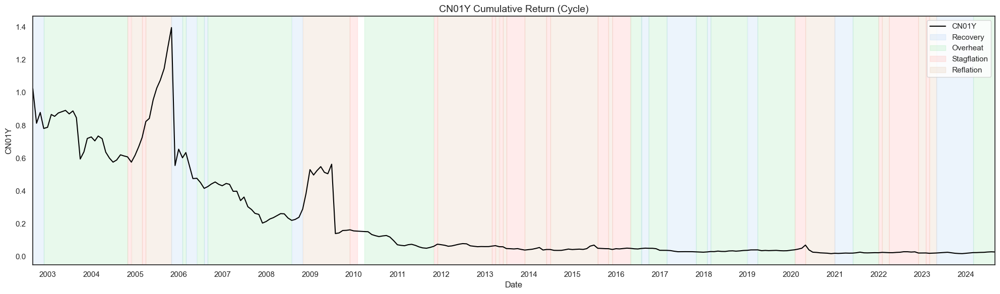

In [135]:
import matplotlib.dates as mdates

# Set up the seaborn theme
sns.set(style="white")
source = 'Cycle'

for f in list(data.columns[5:])[::-1]:
    df = data[['Date',source, f]].dropna()
    df['return'] = (1 + df[f]/100).cumprod()
    # Identify cycle changes by comparing with the previous row
    df["cycle_change"] = df[source] != df[source].shift()

    # Use `cumsum` to create a unique group for each continuous cycle segment
    df["cycle_group"] = df["cycle_change"].cumsum()

    # Group by cycle and cycle_group, then find the min and max dates for each group
    cycle_periods = df.groupby([source, "cycle_group"]).agg(
        start_date=("Date", "min"),
        end_date=("Date", "max"),
        cycle=(source, "first")
    ).reset_index(drop=True)
    
    cycle_periods.sort_values('start_date').head(20)

    # Create the plot
    fig, ax = plt.subplots(figsize=(20, 6))

    # Use seaborn's lineplot for the return line
    sns.lineplot(data=df, x="Date", y="return", color="black", ax=ax, label=f)

    # Define colors for each cycle type
    pastel_colors = sns.color_palette("pastel")
    cycle_colors = {
        "Reflation": pastel_colors[5], 
        "Recovery": pastel_colors[0],  
        "Overheat": pastel_colors[2],     
        "Stagflation": pastel_colors[3]   
    }
    # Add shaded background colors for each cycle period
    for cycle_group, group_data in df.groupby("cycle_group"):
        cycle_name = group_data[source].iloc[0]
        color = cycle_colors.get(cycle_name, "gray")
        ax.axvspan(group_data["Date"].min(), group_data["Date"].max() + pd.DateOffset(months=1), color=color, alpha=0.2, label=cycle_name)

    # Ensure the x-axis limits match the data range to avoid cutoff
    ax.set_xlim(df["Date"].min(), df["Date"].max())

    # Remove duplicate legend entries
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc="upper right")

    # Enhance plot aesthetics
    ax.set_xlabel("Date", fontsize=12)
    ax.set_ylabel(f, fontsize=12)
    ax.set_title(f"{f} Cumulative Return ({source})", fontsize=14)
    # plt.xticks(rotation=45)
    # sns.despine(trim=True)  # Optional: removes top and right spines for a cleaner look

    # Format the x-axis to show "MMM-YY"
    ax.xaxis.set_major_locator(mdates.YearLocator())
    # ax.xaxis.set_major_formatter(DateFormatter("%Y"))

    plt.tight_layout()
    plt.show()